In [2]:
import pandas as pd
import os
import csv

In [3]:
df = pd.read_csv('paired-csv/training.csv')
df.head()

,pair,will_merge,relative_position,relative_velocity,mass1,mass2,numSubStruct1,numSubStruct2,sigV1,sigV2,lambda1,lambda2,cNFW1,cNFW2,Ekin1,Ekin2,Epot1,Epot2,ovdens1,ovdens2
0,"(25000000000005, 25000000000044)",1,142.999429,156.887982,1.157680e+11,3.716270e+10,0,0,222.66,127.63,0.042882,0.054696,6.32512,-1.00000,2.869820e+15,3.026660e+14,-5.049130e+15,-5.517260e+14,198.15,306.36
1,"(25000000000049, 25000000000178)",1,122.366968,135.969394,3.875570e+10,1.933400e+10,0,0,143.60,95.76,0.017409,0.022634,7.62566,6.94666,3.995630e+14,8.864650e+13,-7.361200e+14,-2.568310e+14,161.55,316.27
2,"(25000000000267, 25000000000110)",0,26521.986181,455.357322,1.608690e+10,2.615220e+10,0,0,82.67,157.09,0.052627,0.107450,10.03200,8.29273,5.497580e+13,3.227020e+14,-1.535520e+14,-4.187950e+14,82.56,176.73
3,"(25000000000267, 25000000000275)",0,39706.274679,745.568516,1.608690e+10,1.608690e+10,0,0,82.67,90.99,0.052627,0.051506,10.03200,9.88054,5.497580e+13,6.658600e+13,-1.535520e+14,-1.471820e+14,82.56,111.89
4,"(27000000000004, 27000000000154)",1,143.563899,174.686373,1.583850e+11,2.662480e+10,1,0,246.66,138.82,0.014668,0.090962,9.51642,4.49405,4.818010e+15,2.565430e+14,-8.754640e+15,-3.660130e+14,197.92,213.19


In [4]:
from sklearn.preprocessing import StandardScaler

# Drop the 'pair' column
df = df.drop(columns=['pair'])

# Separate the features and the target
X = df.drop(columns=['will_merge'])
y = df['will_merge']

# Standardize the features
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Check the standardized features
X_scaled.head()

,relative_position,relative_velocity,mass1,mass2,numSubStruct1,numSubStruct2,sigV1,sigV2,lambda1,lambda2,cNFW1,cNFW2,Ekin1,Ekin2,Epot1,Epot2,ovdens1,ovdens2
0,-0.623386,-0.781243,-0.318598,-0.456249,-0.105078,-0.068472,-0.274778,-0.445046,-0.586654,-0.384442,-0.404296,-1.119958,-0.113010,-0.259660,0.125457,0.284781,-0.036806,-0.067194
1,-0.623454,-0.796671,-0.319032,-0.456391,-0.105078,-0.068472,-0.479315,-0.523797,-1.269574,-1.199066,-0.263706,-0.346904,-0.113015,-0.259662,0.125463,0.284782,-0.037158,-0.067132
2,-0.536378,-0.561104,-0.319160,-0.456337,-0.105078,-0.068472,-0.636948,-0.372250,-0.325395,0.955921,-0.003577,-0.215958,-0.113016,-0.259660,0.125464,0.284781,-0.037915,-0.068006
3,-0.492891,-0.347056,-0.319160,-0.456417,-0.105078,-0.068472,-0.636948,-0.535584,-0.325395,-0.465493,-0.003577,-0.061495,-0.113016,-0.259662,0.125464,0.284783,-0.037915,-0.068412
4,-0.623384,-0.768115,-0.318357,-0.456333,-0.093017,-0.068472,-0.212687,-0.417396,-1.343059,0.536997,-0.059312,-0.585495,-0.113006,-0.259661,0.125452,0.284782,-0.036809,-0.067778


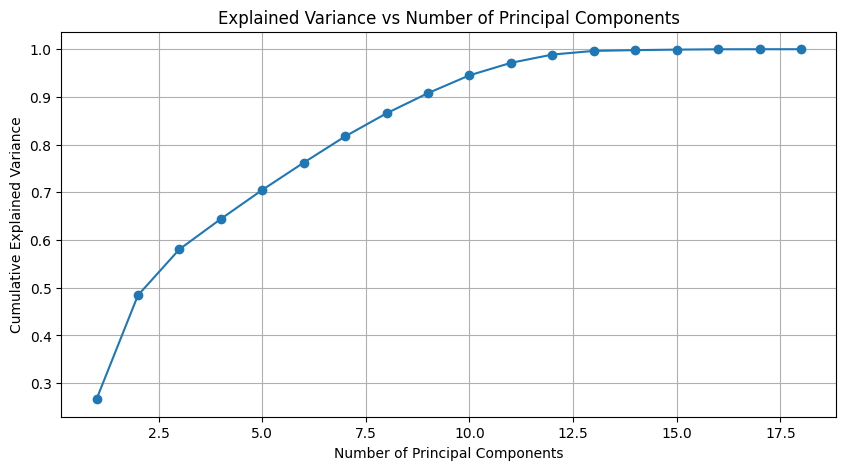

In [5]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Perform PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Plot the explained variance ratio
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(X.columns) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs Number of Principal Components')
plt.grid(True)
plt.show()

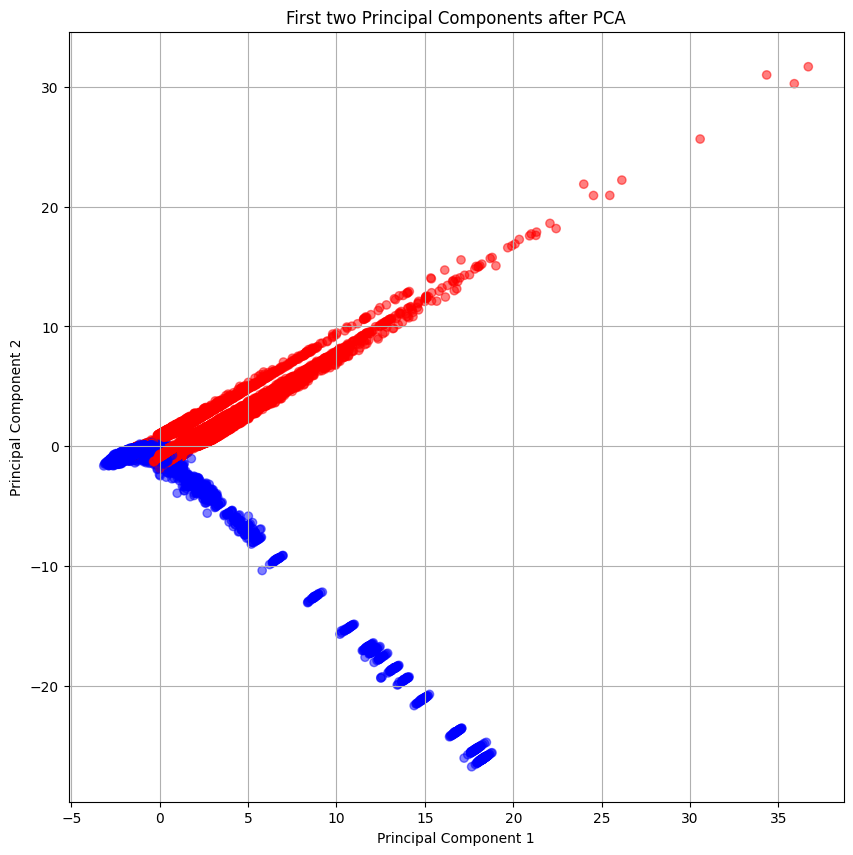

In [6]:
# Perform PCA with 5 components
pca = PCA(n_components=5)
X_pca = pca.fit_transform(X_scaled)

# Convert to DataFrame for convenience
df_pca = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(5)])
df_pca['will_merge'] = y

# Visualize the first two principal components
plt.figure(figsize=(10, 10))
colors = {0: 'red', 1: 'blue'}
plt.scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['will_merge'].map(colors), alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('First two Principal Components after PCA')
plt.grid(True)
plt.show()

In [9]:
import plotly.graph_objects as go

trace = go.Scatter3d(
    x=df_pca['PC1'],
    y=df_pca['PC2'],
    z=df_pca['PC3'],
    mode='markers',
    marker=dict(
        size=3,
        color=df_pca['will_merge'],
        colorscale='Viridis', 
        opacity=0.8
    )
)

data = [trace]
layout = go.Layout(
    scene=dict(
        xaxis=dict(
            title='Principal Component 1',
        ),
        yaxis=dict(
            title='Principal Component 2',
        ),
        zaxis=dict(
            title='Principal Component 3',
        ),
        camera=dict(
            up=dict(x=0, y=0, z=1),
            center=dict(x=0, y=0, z=0),
            eye=dict(x=1.25, y=1.25, z=1.25)
        )
    ),
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    ),
    autosize=False,
    width=800,
    height=800,
)

fig = go.Figure(data=data, layout=layout)

fig.show()
